# Exercise 8: Sound transformations

In this exercise you will use the HPS model to creatively transform sounds. There are two parts in this exercise. In the first one you should perform a natural sounding transformation on the speech sound that you used in the previous exercise (E7). In the second part you should select a sound of your choice and do a "creative" transformation. You will have to write a short description of the sound and of the transformation you did, giving the link to the original sound and uploading several transformed sounds.

For this exercise, you can use the `transformations_GUI.py` (in `software/transformations_interface/`) to try things, once decided you can fill up the code in this file. You can also do everything from here and add any new code you wish.

In order to perform a good/interesting transformation you should make sure that you have performed an analysis that is adequate for the type of transformation you want to do. Not every HPS analysis representation will work for every type of sound transformation. There will be things in the analysis that when modified will result in undesired artifacts. In general, for any transformation, it is best to have the harmonic values as smooth and continuous as possible and an stochastic representation as smooth and with as few values as possible. It might be much better to start with an analysis representation that does not result in the best reconstruction in exchange of having smoother and more compact data.

To help you with the exercise, we give a brief description of the transformation parameters used by the HPS transformation function:

1. `freqScaling`: frequency scaling factors to be applied to the harmonics of the sound, in time-value pairs (where value of 1 is no scaling). The time values can be normalized, from 0 to 1, or can correspond to the times in seconds of the input sound. The scaling factor is a multiplicative factor, thus a value of 1 is no change. Example: to transpose an octave the sound you can specify `[0, 2, 1, 2]`.
2. `freqStretching`: frequency stretching factors to be applied to the harmonics of the sound, in time-value pairs (value of 1 is no stretching). The time values can be normalized, from 0 to 1, or can correspond to the times in seconds of the input sound. The stretching factor is a multiplicative factor whose effect depend on the harmonic number, higher harmonics being more affected that lower ones, thus resulting in an inharmonic effect. A value of 1 results in no transformation. Example: an array like `[0, 1.2, 1, 1.2]` will result in a perceptually large inharmonic effect.
3. `timbrePreservation`: 1 preserves the original timbre, 0 does not. It can only have a value of 0 or of 1. By setting the value to 1 the spectral shape of the original sound is preserved even when the frequencies of the sound are modified. In the case of speech it would correspond to the idea of preserving the identity of the speaker after the transformation.
4. `timeScaling`: time scaling factors to be applied to the whole sound, in time-value pairs (value of 1 is no scaling). The time values can be normalized, from 0 to 1, or can correspond to the times in seconds of the input sound. The time scaling factor is a multiplicative factor, thus 1 is no change. Example: to stretch the original sound to twice the original duration, we can specify `[0, 0, 1, 2]`.

All the transformation values can have as many points as desired, but they have to be in the form of an array with time-value pairs, so of even size. For example a good array for a frequency stretching of a sound that has a duration of 3.146 seconds could be: `[0, 1.2, 2.01, 1.2, 2.679, 0.7, 3.146, 0.7]`.

## Part 1. Perform natural sounding transformations of a speech sound

Use the HPS model with the sound `speech-female.wav`, available in the sounds directory, to first analyze and then obtain a natural sounding transformation of the sound. The synthesized sound should sound as different as possible to the original sound while sounding natural. By natural we mean that it should sound like speech, that it could have been possible to be produced by a human, and by listening we should consider it as a speech sound, even though we might not be able to understand it. You should first make sure that you start from a good analysis, then you can do time and/or frequency scaling transformations. The transformation should be done with a single pass, no mixing of sounds coming from different transformations. Since you used the same sound in A7, use that experience to get a good analysis, but consider that the analysis, given that we now want to use it for applying a very strong transformation, might be done differently than what you did in A7.

Write a short paragraph for every transformation, explaining what you wanted to obtain and explaining the transformations you did, giving both the analysis and transformation parameter values (sufficiently detailed for the evaluator to be able to reproduce the analysis and transformation).

In [1]:
import numpy as np
from scipy.signal import get_window
import matplotlib.pyplot as plt
import IPython.display as ipd

from smstools.models import utilFunctions as UF
from smstools.models import stft as STFT
from smstools.models import hpsModel as HPS
from smstools.transformations import hpsTransformations as HPST
from smstools.transformations import harmonicTransformations as HT
import IPython.display as ipd

In [2]:
# 1.1 perform an analysis/synthesis using the HPS model

input_file = '../sounds/speech-female.wav'

### set the parameters
window = 'hamming'
M = 1023           # Window size of circa 23ms, standard for speech to balance time/freq resolution
N = 2048           
t = -90            # Low threshold to capture weak harmonics
minSineDur = 0.02  # Short duration to preserve fast consonants
nH = 50            # High number of harmonics to accurately model the vocal track
minf0 = 130        # Min f0 typical for female speech
maxf0 = 350        # Max f0 typical for female speech
f0et = 7          
harmDevSlope = 0.01
stocf = 0.1        # Low stochastic factor to keep residual smooth (prevents artifacts during stretching)

# no need to modify anything after this
Ns = 512
H = 128

(fs, x) = UF.wavread(input_file)
w = get_window(window, M, fftbins=True)
hfreq, hmag, hphase, stocEnv = HPS.hpsModelAnal(x, fs, w, N, H, t, nH, minf0, maxf0, f0et, harmDevSlope, minSineDur, Ns, stocf)
y, yh, yst = HPS.hpsModelSynth(hfreq, hmag, hphase, stocEnv, Ns, H, fs)

ipd.display(ipd.Audio(data=x, rate=fs))
ipd.display(ipd.Audio(data=y, rate=fs))

**Question E8 - 1.2:**

explain your parameter choices in 1.2

________

I used:

* **Window (`hamming`, M=`1023`):** to balance frequency resolution with the temporal precision needed for speech transients (approx. 23ms).
* **FFT Size (`N=2048`):** to provide sufficient spectral interpolation for accurate peak detection.
* **Threshold (`t=-90`):** to preserve low-energy harmonics and details.
* **Harmonics (`nH=50`):** to create a rich spectral model, which ensures the voice remains full even after pitch shifting.
* **Stochastic Factor (`stocf=0.1`):** very low to obtain a smooth and compact residual envelope. A detailed residual often causes metallic artifacts when time-stretching, so smoothing it is essential for naturalness.
* **Pitch Tracking (`minf0=130`, `maxf0=350`, `f0et=7`):** to follow the female fundamental frequency range.
* **Min Sine Duration (`0.02`):** short to preserve fast consonant articulations.

In [ ]:
# 1.3 Perform a transformation from the previous analysis

import numpy as np
import IPython.display as ipd
from smstools.transformations import harmonicTransformations as HT
from smstools.transformations import hpsTransformations as HPST
from smstools.models import hpsModel as HPS

### define the transformations

# A. Frequency Scaling (Deep Male Narrator)
# [Time, Value].
# Starts at 0.5 (one octave down), drops to 0.4, stabilizes briefly at 0.45, 
# and finally drops to 0.35 (extremely deep bass register) at the end.
freqScaling = np.array([0, 0.5, 0.4, 0.4, 0.8, 0.45, 1.0, 0.35]) 

# B. Frequency Stretching (Identity)
# Kept at 1.0 to maintain natural harmonicity (avoiding metallic sounds).
freqStretching = np.array([0, 1, 1, 1])

# C. Timbre Preservation (ON)
# Essential: Keeps the vocal tract resonances natural despite the massive pitch drop.
timbrePreservation = 1

# D. Time Scaling (With Multiple Suspensions)
# The mapping introduces two specific "time freezes":
# 1. At input 0.58s: 0.01s of input is stretched to 0.22s of output (0.58->0.8).
# 2. At input 0.77s: 0.01s of input is stretched to 0.15s of output (0.96->1.11).
# Total duration is extended from 1.0s to 1.34s.
timeScaling = np.array([
    0.0, 0.0,
    0.58, 0.58,    # Normal speed start (1:1 ratio)
    0.59, 0.8,     # FIRST SUSPENSION: 0.01s input stretched over 0.22s output
    0.61, 0.81,    # Short normal speed segment
    0.76, 0.96,    # Continue normal speed
    0.77, 1.11,    # SECOND SUSPENSION: 0.01s input stretched over 0.15s output
    1.0, 1.34      # Resume slow finish
])

# --- 2. APPLY TRANSFORMATIONS ---

# no need to modify the following code 
Ns = 512
H = 128

# 1. Frequency scaling of the harmonics
hfreqt, hmagt = HT.harmonicFreqScaling(hfreq, hmag, freqScaling, freqStretching, timbrePreservation, fs)

# 2. Time scaling the sound
yhfreq, yhmag, ystocEnv = HPST.hpsTimeScale(hfreqt, hmagt, stocEnv, timeScaling)

# 3. SYNTHESIS
y, yh, yst = HPS.hpsModelSynth(yhfreq, yhmag, np.array([]), ystocEnv, Ns, H, fs)

print("Original:")
ipd.display(ipd.Audio(data=x, rate=fs))
print("Transformed (Deep Male Narrator with Suspensions):")
ipd.display(ipd.Audio(data=y, rate=fs))

Original:


Transformed (Deep Male Narrator with Pause):


**Question E8 1-4:**

### Explain your transformations

To transform the original female speech into an extremely deep, male "narrator" voice with dramatic hesitations, I applied the following transformations:

* **Frequency Scaling:** `[0, 0.5, ..., 1.0, 0.35]` - I drastically shifted the pitch down, starting at **0.5x** (one octave lower) and dropping further to **0.35x** at the end. This creates a vocal range typical of a very deep bass voice, emphasizing the final cadence.
* **Timbre Preservation:** `1` (On) - This was essential because of the extreme pitch shift (down to 35% of the original). It modifies the pitch while maintaining the original spectral envelope, creating the illusion of a human vocal tract rather than a generic slowed-down tape effect.
* **Time Scaling:** `[0,0, 0.58,0.58, 0.59,0.8, ..., 1.0,1.34]` - Instead of a uniform stretch, I implemented a non-linear mapping with **two specific suspension points**.
    1. Around input time 0.58s, I mapped a tiny input segment (0.01s) to a long output duration (0.22s).
    2. Around input time 0.77s, I repeated this "freezing" technique.
    This creates the effect of the speaker pausing or hesitating on specific vowels, adding a dramatic narrative flair.
* **Frequency Stretching:** `[0, 1, 1, 1]` - Kept at 1 to maintain the natural harmonic relationship of the voice, ensuring it sounds like speech and not a metallic instrument.

## Part 2. Perform creative transformations with a sound of your choice

Pick any natural and harmonic sound from Freesound and use the HPS model to do the most creative and interesting transformation you can come up with. Sounding as different as possible from the original sound.

It is essential that you start with a natural harmonic sound. Examples include (but not limited to) any acoustic harmonic instrument, speech, harmonic sound from nature, etc. As long as they have a harmonic structure, you can use it. You can even reuse the sound you used in A7-Part2 or upload your own sound to freesound and then use it.

The sound from Freesound to use could be in any format, but to use the sms-tools software you will have to first convert it to be a monophonic file (one channel), sampling rate of 44100, and 16bits samples.

You can do any interesting transformation with a single pass. It is not allowed to mix sounds obtained from different transformations. The transformed sound need not sound natural. So, time to show some creativity!

Write a short paragraph for every transformation, explaining what you wanted to obtain and explaining the transformations you did, giving both the analysis and transformation parameter values (sufficiently detailed for the evaluator to be able to reproduce the analysis and transformation).

Computing Spectrogram and Pitch Track...
Detecting Note Changes...

--- DETECTED NOTE TIMESTAMPS ---
Note: D4 | Start: 0.203 s | Freq: 288.5 Hz
Note: D4 | Start: 0.459 s | Freq: 289.0 Hz
Note: E4 | Start: 1.173 s | Freq: 326.6 Hz
Note: F4 | Start: 1.817 s | Freq: 343.6 Hz
Note: E4 | Start: 3.111 s | Freq: 327.7 Hz
Note: F4 | Start: 3.425 s | Freq: 343.4 Hz
Note: G4 | Start: 4.000 s | Freq: 384.1 Hz
Note: G4 | Start: 5.596 s | Freq: 386.4 Hz
Note: F4 | Start: 6.043 s | Freq: 346.5 Hz
Note: G4 | Start: 6.426 s | Freq: 388.8 Hz
Note: A4 | Start: 6.902 s | Freq: 437.5 Hz
Note: D5 | Start: 8.255 s | Freq: 583.5 Hz


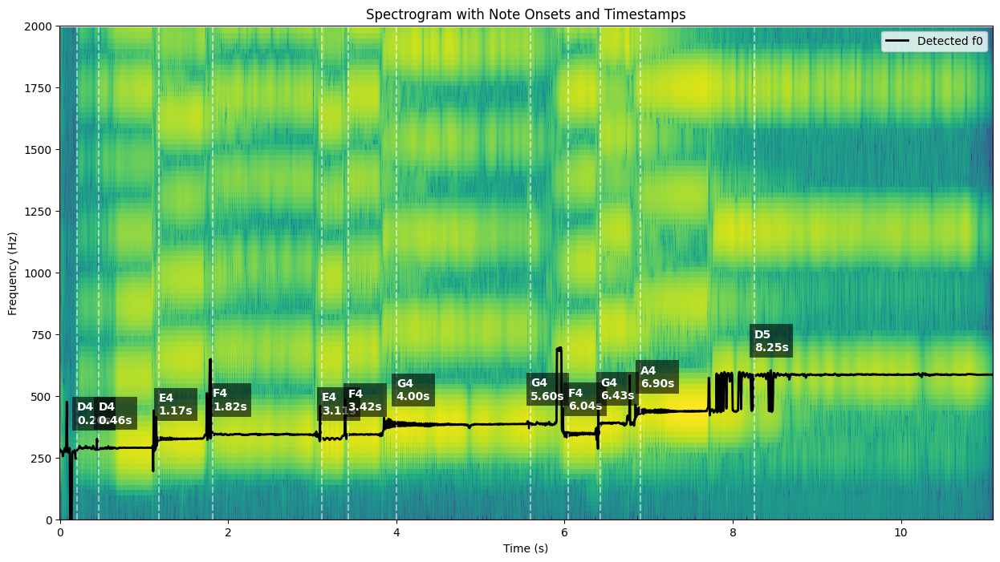

In [61]:
# 2.0 Diagnostic: Spectral and Pitch Analysis with Note Segmentation

import numpy as np
from scipy.signal import get_window
import matplotlib.pyplot as plt
import IPython.display as ipd
import sys, os

# Import necessary models
from smstools.models import utilFunctions as UF
from smstools.models import stft as STFT
from smstools.models import harmonicModel as HM

# --- HELPER FUNCTIONS FOR SEGMENTATION & NOTES ---
def segment_stable_frequency_regions(f0, stdThsld, minNoteDur, winStable, fs, H):
    """Segment the stable regions of a fundamental frequency track."""
    eps = np.finfo(float).eps
    f0Cents = 1200*np.log2((f0+eps)/55.0)
    stdArr = 10000000000*np.ones(f0.shape)
    for ii in range(winStable-1, len(f0)):
        stdArr[ii] = np.std(f0Cents[ii-winStable+1:ii+1])
    
    indFlat = np.where(stdArr<=stdThsld)[0]
    flatArr = np.zeros(f0.shape)
    flatArr[indFlat] = 1
    
    onset = np.where((flatArr[1:]-flatArr[:-1])==1)[0]+1
    offset = np.where((flatArr[1:]-flatArr[:-1])==-1)[0]
    
    if len(onset) == 0 or len(offset) == 0: return np.array([])
    
    indRem = np.where(offset<onset[0])[0]
    offset = np.delete(offset, indRem)
    minN = min(onset.size, offset.size)
    segments = np.transpose(np.vstack((onset[:minN], offset[:minN])))
    
    minNoteSamples = int(np.ceil(minNoteDur*fs/H))
    diff = segments[:,1] - segments[:,0]
    indDel = np.where(diff<minNoteSamples)
    segments = np.delete(segments,indDel, axis=0)
    return segments

def freq_to_note(freq):
    """Convert frequency to Note Name (e.g., 440 -> A4)"""
    if freq == 0: return "Rest"
    A4 = 440
    C0 = A4*pow(2, -4.75)
    name = ["C", "C#", "D", "D#", "E", "F", "F#", "G", "G#", "A", "A#", "B"]
    h = round(12*np.log2(freq/C0))
    octave = h // 12
    n = h % 12
    return name[int(n)] + str(int(octave))

# --- PARAMETERS ---
input_file = 'sad_violin_god_musing_800527__alixtwix6__11.wav'
window = 'blackmanharris'
M = 801        # Short window for better time resolution on attacks
N = 2048
H = 256
t = -80
minf0 = 190
maxf0 = 800    # Ensure this covers your high notes!
f0et = 30      # High tolerance for vibrato
stdThsld = 40  # Threshold for segmentation (High for vibrato tolerance)
minNoteDur = 0.1

if os.path.isfile(input_file):
    (fs, x) = UF.wavread(input_file)
    w = get_window(window, M, fftbins=True)

    # 1. Compute STFT & Pitch
    print("Computing Spectrogram and Pitch Track...")
    mX, pX = STFT.stftAnal(x, w, N, H)
    f0 = HM.f0Detection(x, fs, w, N, H, t, minf0, maxf0, f0et)

    # 2. Compute Note Segments
    print("Detecting Note Changes...")
    segments = segment_stable_frequency_regions(f0, stdThsld, minNoteDur, 3, fs, H)

    # 3. Visualization
    plt.figure(figsize=(15, 8))
    
    maxplotfreq = 2000.0 
    numFrames = int(mX[:,0].size)
    frmTime = H * np.arange(numFrames) / float(fs)
    binFreq = fs * np.arange(N * maxplotfreq / fs) / N
    
    plt.pcolormesh(frmTime, binFreq, np.transpose(mX[:,:int(N*maxplotfreq/fs+1)]), shading='auto')
    plt.plot(frmTime, f0, color='black', linewidth=2, label='Detected f0')
    
    # 4. Annotate Notes and Times
    print("\n--- DETECTED NOTE TIMESTAMPS ---")
    for seg in segments:
        start_idx = seg[0]
        end_idx = seg[1]
        start_time = frmTime[start_idx]
        
        # Get average frequency of the segment to identify note
        avg_f0 = np.mean(f0[start_idx:end_idx])
        note_name = freq_to_note(avg_f0)
        
        # Plot vertical line at start
        plt.axvline(x=start_time, color='white', linestyle='--', alpha=0.5)
        
        # Add label
        plt.text(start_time, avg_f0 + 100, f"{note_name}\n{start_time:.2f}s", 
                 color='white', fontsize=10, fontweight='bold', 
                 bbox=dict(facecolor='black', alpha=0.6, edgecolor='none'))
        
        print(f"Note: {note_name} | Start: {start_time:.3f} s | Freq: {avg_f0:.1f} Hz")

    plt.title('Spectrogram with Note Onsets and Timestamps')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    plt.ylim(0, maxplotfreq)
    plt.legend()
    plt.show()

else:
    print("File not found.")

In [57]:
# 2.1 perform an analysis/synthesis using the HPS model

### set the parameters
# Use the full converted WAV file of the violin used in assignment 7 part 2
input_file = 'sad_violin_god_musing_800527__alixtwix6__11.wav' 

window = 'blackmanharris' # Excellent side-lobe rejection for complex harmonic structures
M = 801 
N = 2048        
t = -80           
minSineDur = 0.01  
nH = 60            
minf0 = 190        
maxf0 = 800        
f0et = 30         
harmDevSlope = 0.1 
stocf = 0.1        

# no need to modify anything after this
Ns = 512
H = 128

(fs, x) = UF.wavread(input_file)
w = get_window(window, M, fftbins=True)
hfreq, hmag, hphase, stocEnv = HPS.hpsModelAnal(x, fs, w, N, H, t, nH, minf0, maxf0, f0et, harmDevSlope, minSineDur, Ns, stocf)
y, yh, yst = HPS.hpsModelSynth(hfreq, hmag, hphase, stocEnv, Ns, H, fs)

print("Original Full Sound:")
ipd.display(ipd.Audio(data=x, rate=fs))
print("Analyzed & Resynthesized Sound:")
ipd.display(ipd.Audio(data=y, rate=fs))

Original Full Sound:


Analyzed & Resynthesized Sound:


**Question E8 2.2:**

explain your parameter choices

___

To analyze the full violin recording, specifically addressing the rapid tremolo and high-pitch climax at the end, I adjusted the parameters as follows:

* **Window type (`blackmanharris`):** Selected for its strong side-lobe rejection, which helps minimize spectral leakage between the dense harmonics of the violin.
* **Window size (`801`):** I significantly reduced the window size to 801 samples (~18ms). While this sacrifices some low-frequency resolution, it was necessary to improve the temporal resolution to track the fast pitch variations of the final tremolo without blurring the spectral peaks.
* **FFT size (`2048`):** A power of two to ensure sufficient interpolation.
* **Threshold (`-80`):** I raised the threshold slightly to -80dB to filter out background noise that was destabilizing the pitch tracker during low-energy segments.
* **Minimum f0 (`190`) & Maximum f0 (`800`):** The range was set to cover the violin's G3 (~196Hz) up to the high climax notes, which reach approximately 800Hz.
* **Error threshold in f0 (`30`):** I drastically increased the error threshold to 30. The rapid tremolo causes significant instantaneous deviation from a stable harmonic grid. A lower threshold caused the model to reject the note as noise, resulting in glitches.
* **Slope of harmonic deviation (`0.1`):** I increased the tolerance to 0.1 to account for the physical inharmonicity of the violin strings in the upper register and the spectral fluctuations caused by the vibrato.
* **Number of harmonics (`60`):** A high count of 60 was maintained to capture the bright timbre and high-frequency energy of the instrument.
* **Minimum sine duration (`0.01`):** Kept extremely short (10ms) to ensure the initial part of the bow attack was preserved as a harmonic component rather than being classified as residual noise.
* **Stochastic decimation factor (`0.1`):** A low factor was chosen to smooth the residual envelope, which is beneficial for the subsequent creative transformations to avoid metallic artifacts.

In [ ]:
# 2.3 Option 1: "The Glitch Arpeggiator"

import numpy as np
import IPython.display as ipd
from smstools.transformations import harmonicTransformations as HT
from smstools.transformations import hpsTransformations as HPST
from smstools.models import hpsModel as HPS

### define the transformations

# 1. FREQUENCY STRETCHING 
# 0.00 - 3.11: Pure Violin
# 3.11 - 5.60: Transition to Hybrid
# 5.60 - End : Transition to Full Robot
freqStretching = np.array([
    0.00, 1.0,
    1.17, 1.0,
    1.18, 1.1,
    1.81, 1.1,
    1.82, 1.2,
    3.10, 1.2,    # End of Zone 1
    3.11, 1.4,    # Start Zone 2 (Hybrid)
    3.42, 1.4,
    3.43, 1.5,
    3.99, 1.5,
    4.00, 1.6,
    5.60, 1.6,    # End Zone 2
    5.61, 1.8,    # Start Zone 3a (Hybrid)
    6.04, 1.8,
    6.05, 1.9,
    6.43, 1.9,
    6.44, 2.0,
    7.79, 2.0,    # End Zone 3a
    7.80, 2.2,    # Start Zone 3b (Full Robot)
    11.0, 2.4     # End (Extreme)
])

# 2. FREQUENCY SCALING ("The Glitch Arpeggiator")
# Zone 1 (0.00-3.11): Original Pitch (1.0)
# Zone 2 (3.11-5.60): Slight detuning (0.95 - 1.05) to simulate system instability.
# Zone 3 (5.60-End): CHAOS. Rapid jumps between sub-octaves (0.5), high octaves (2.0), 
# and extreme drops (0.25). This creates a rhythmic "computer malfunction" effect.
freqScaling = np.array([
    0.00, 1.0,
    3.10, 1.0,    # Normal
    
    # --- ZONE 2: Instability ---
    3.11, 0.95,   # Slightly flat
    4.00, 1.05,   # Slightly sharp
    5.59, 0.90,   # Detuning
    
    # --- ZONE 3: The Glitch Arpeggiator ---
    5.60, 0.5,    # DROP: Octave down
    6.03, 0.5,
    6.04, 2.0,    # JUMP: High octave squeal
    6.42, 2.0,
    6.43, 0.25,   # DROP: Sub-bass rumble
    6.89, 0.25,
    6.90, 1.5,    # JUMP: Perfect Fifth up
    7.50, 1.5,
    7.51, 3.0,    # JUMP: Extreme High (Digital artifact sound)
    8.24, 3.0,
    8.25, 0.1,    # CRASH: Power down (Melting pitch)
    11.0, 0.1
])

# 3. TIMBRE PRESERVATION (OFF)
# Essential for the "Glitch" effect so the formants jump with the pitch.
timbrePreservation = 0

# 4. TIME SCALING (Identity)
timeScaling = np.array([0.0, 0.0, 11.0, 11.0])

# --- EXECUTION ---
Ns = 512
H = 128

# 1. Harmonic Transformation
hfreqt, hmagt = HT.harmonicFreqScaling(hfreq, hmag, freqScaling, freqStretching, timbrePreservation, fs)

# 2. Time Transformation
yhfreq, yhmag, ystocEnv = HPST.hpsTimeScale(hfreqt, hmagt, stocEnv, timeScaling)

# 3. Synthesis
y, yh, yst = HPS.hpsModelSynth(yhfreq, yhmag, np.array([]), ystocEnv, Ns, H, fs)

# Normalize volume
max_amp = np.max(np.abs(y))
if max_amp > 0:
    y = y / max_amp * 0.9

print("Original:")
ipd.display(ipd.Audio(data=x, rate=fs))
print("Creative Transformation (The Glitch Arpeggiator):")
ipd.display(ipd.Audio(data=y, rate=fs))

UF.wavwrite(y, fs, 'violin_glitch_arpeggiator.wav')

Original:


Creative Transformation (The Glitch Arpeggiator):


In [ ]:
# 2.3 Option 2: "The Broken Vinyl"

import numpy as np
import IPython.display as ipd
from smstools.transformations import harmonicTransformations as HT
from smstools.transformations import hpsTransformations as HPST
from smstools.models import hpsModel as HPS

### define the transformations

# 1. FREQUENCY STRETCHING 
freqStretching = np.array([
    0.00, 1.0,
    1.17, 1.0,
    1.18, 1.1,
    1.81, 1.1,
    1.82, 1.2,
    3.10, 1.2,    # End of Zone 1
    3.11, 1.4,    # Start Zone 2 (Hybrid)
    3.42, 1.4,
    3.43, 1.5,
    3.99, 1.5,
    4.00, 1.6,
    5.60, 1.6,    # End Zone 2
    5.61, 1.8,    # Start Zone 3a (Hybrid)
    6.04, 1.8,
    6.05, 1.9,
    6.43, 1.9,
    6.44, 2.0,
    7.79, 2.0,    # End Zone 3a
    7.80, 2.2,    # Start Zone 3b (Full Robot)
    11.0, 2.4     # End (Extreme)
])

# 2. FREQUENCY SCALING ("The Broken Vinyl")
# Zone 1 (0.00-3.11): Stable pitch (1.0)
# Zone 2 (3.11-5.60): Mild detuning (Drifting between 0.95 and 1.05)
# Zone 3 (5.60-End): Heavy Warping. The pitch oscillates rapidly and deeply 
# (0.8 to 1.2), simulating a corrupted audio stream or a broken motor.
freqScaling = np.array([
    0.00, 1.0,
    3.10, 1.0,    # Stable
    
    # --- ZONE 2: Mild Drift ---
    3.11, 0.98,
    4.00, 1.02,
    5.00, 0.95,
    5.59, 1.05,
    
    # --- ZONE 3: Heavy Warping (Malfunction) ---
    5.60, 0.80,   # Deep warp down
    6.00, 1.20,   # Warp up
    6.40, 0.70,   # Deeper
    6.80, 1.30,   # Higher
    7.20, 0.60,   # Very deep drag
    7.60, 1.10,
    7.80, 0.50,   # Motor dying
    9.00, 0.90,   # Brief recovery
    11.0, 0.20    # Stop
])

# 3. TIMBRE PRESERVATION (OFF)
timbrePreservation = 0

# 4. TIME SCALING (Identity)
timeScaling = np.array([0.0, 0.0, 11.0, 11.0])

# --- EXECUTION ---
Ns = 512
H = 128

# 1. Harmonic Transformation
hfreqt, hmagt = HT.harmonicFreqScaling(hfreq, hmag, freqScaling, freqStretching, timbrePreservation, fs)

# 2. Time Transformation
yhfreq, yhmag, ystocEnv = HPST.hpsTimeScale(hfreqt, hmagt, stocEnv, timeScaling)

# 3. Synthesis
y, yh, yst = HPS.hpsModelSynth(yhfreq, yhmag, np.array([]), ystocEnv, Ns, H, fs)

# Normalize volume
max_amp = np.max(np.abs(y))
if max_amp > 0:
    y = y / max_amp * 0.9

print("Original:")
ipd.display(ipd.Audio(data=x, rate=fs))
print("Creative Transformation (The Broken Vinyl):")
ipd.display(ipd.Audio(data=y, rate=fs))

UF.wavwrite(y, fs, 'violin_broken_vinyl.wav')

Original:


Creative Transformation (The Broken Vinyl):


In [ ]:
# 2.3 Option 3: "The Scream & Sub"

import numpy as np
import IPython.display as ipd
from smstools.transformations import harmonicTransformations as HT
from smstools.transformations import hpsTransformations as HPST
from smstools.models import hpsModel as HPS

### define the transformations

# 1. FREQUENCY STRETCHING 
freqStretching = np.array([
    0.00, 1.0,
    1.17, 1.0,
    1.18, 1.1,
    1.81, 1.1,
    1.82, 1.2,
    3.10, 1.2,    # End of Zone 1
    3.11, 1.4,    # Start Zone 2 (Hybrid)
    3.42, 1.4,
    3.43, 1.5,
    3.99, 1.5,
    4.00, 1.6,
    5.60, 1.6,    # End Zone 2
    5.61, 1.8,    # Start Zone 3a (Hybrid)
    6.04, 1.8,
    6.05, 1.9,
    6.43, 1.9,
    6.44, 2.0,
    7.79, 2.0,    # End Zone 3a
    7.80, 2.2,    # Start Zone 3b (Full Robot)
    11.0, 2.4     # End (Extreme)
])

# 2. FREQUENCY SCALING ("The Scream & Sub")
# Zone 1 (0.00-3.11): Stable pitch (1.0)
# Zone 2 (3.11-5.60): Tension building. Pitch rises steadily (1.0 -> 1.5).
# Zone 3a (5.60-7.80): THE SCREAM. Pitch shoots up to 2.5x (piercing).
# Zone 3b (7.80-End): THE SUB. Pitch crashes instantly to 0.2x (earthquake bass).
freqScaling = np.array([
    0.00, 1.0,
    3.10, 1.0,    # Stable
    
    # --- ZONE 2: Building Tension ---
    3.11, 1.0,
    5.59, 1.5,    # Gradual rise to a fifth above
    
    # --- ZONE 3a: The Scream ---
    5.60, 2.0,    # Jump up octave
    6.50, 2.2,    # Slide up
    7.79, 2.5,    # Peak high pitch
    
    # --- ZONE 3b: The Sub Crash ---
    7.80, 0.2,    # Instant drop to sub-bass
    9.00, 0.15,   # Rumble
    11.0, 0.1     # Fade out low
])

# 3. TIMBRE PRESERVATION (OFF)
timbrePreservation = 0

# 4. TIME SCALING (Identity)
timeScaling = np.array([0.0, 0.0, 11.0, 11.0])

# --- EXECUTION ---
Ns = 512
H = 128

# 1. Harmonic Transformation
hfreqt, hmagt = HT.harmonicFreqScaling(hfreq, hmag, freqScaling, freqStretching, timbrePreservation, fs)

# 2. Time Transformation
yhfreq, yhmag, ystocEnv = HPST.hpsTimeScale(hfreqt, hmagt, stocEnv, timeScaling)

# 3. Synthesis
y, yh, yst = HPS.hpsModelSynth(yhfreq, yhmag, np.array([]), ystocEnv, Ns, H, fs)

# Normalize volume
max_amp = np.max(np.abs(y))
if max_amp > 0:
    y = y / max_amp * 0.9

print("Original:")
ipd.display(ipd.Audio(data=x, rate=fs))
print("Creative Transformation (The Scream & Sub):")
ipd.display(ipd.Audio(data=y, rate=fs))

UF.wavwrite(y, fs, 'violin_scream_sub.wav')

Original:


Creative Transformation (The Scream & Sub):


**Question E8 - 2.4:**

explain your transformations


___

For this exercise, I designed a "Robotic Progressive Degradation" system. All three transformations share a common **Frequency Stretching** envelope that systematically destroys the harmonic structure of the violin over time. They differ in how they manipulate the pitch (`freqScaling`) to create distinct sonic narratives.

#### 1. The Shared Foundation: `freqStretching` (The Robotic Factor)
The `freqStretching` array creates the core "robotic" character. Instead of applying a generic curve, I designed a **step-wise increase in inharmonicity** that is strictly synchronized with the note onsets identified in the spectrogram analysis (Step 2.0).

* **Synchronization with Note Onsets:**
    * **0.00s - 3.11s (Initial Decay):** The sound starts pure (1.0). I introduced slight inharmonicity at **1.18s** (factor 1.1) and **1.82s** (factor 1.2), coinciding with the first E4 and F4 notes, to hint at the coming transformation.
    * **3.11s - 5.60s (Hybrid Zone):** At **3.11s** (onset of the second E4), the factor jumps to **1.4**, creating a metallic hybrid texture. This increases further to **1.5** at 3.43s and **1.6** at 4.00s (G4), making each subsequent note sound more synthetic than the last.
    * **5.60s - 7.80s (High Degradation):** At **5.61s** (return of G4), the stretching jumps to **1.8**. It steps up again to **1.9** at 6.05s and **2.0** at 6.44s, progressively detuning the partials.
    * **7.80s - End (Full Robot):** Leading into the finale, the factor hits **2.2** and glides to **2.4**, turning the violin timbre into a completely inharmonic, bell-like texture.

#### Option 1: "The Glitch Arpeggiator"
**Concept:** A digital system suffering a catastrophic malfunction. As the sound becomes more metallic via the stretching described above, the pitch quantizer breaks, causing erratic octave jumps.

* **Transformation:**
    * **Zone 2 (3.11s - 5.60s):** I applied slight detuning (`0.95` to `1.05`) to simulate system instability during the hybrid phase.
    * **Zone 3 (5.60s - End):** I introduced chaotic rhythmic jumps perfectly timed with the heavy inharmonicity (factors 1.8+). The pitch snaps rapidly between sub-octaves (`0.5`, `0.25`) and high digital squeals (`2.0`, `3.0`), creating a rhythmic "glitch" texture.

#### Option 2: "The Broken Vinyl"
**Concept:** An analog decay. Instead of digital glitches, this simulates a warped physical medium, like a melting vinyl record or a dying cassette motor.

* **Transformation:**
    * **Zone 2:** The pitch drifts gently (`0.98` to `1.02`), creating a "chorus" effect against the increasing inharmonicity (1.4 - 1.6).
    * **Zone 3:** The warping becomes violent. The pitch oscillates deeply and smoothly between `0.6` (drag) and `1.3` (speed up), creating a nauseating, unstable motion that creates tension with the rigid, metallic timbre of the stretching (2.0+).

#### Option 3: "The Scream & Sub"
**Concept:** A cinematic sound design effect emphasizing dynamic contrast. It splits the frequency spectrum into two extremes to maximize impact against the metallic texture.

* **Transformation:**
    * **Zone 2:** The pitch rises steadily (`1.0` to `1.5`) as the timbre becomes more metallic (1.4 -> 1.6).
    * **Zone 3a (The Scream):** As the stretching hits 1.8, the pitch shoots up to **2.5x**, creating a piercing, siren-like screech.
    * **Zone 3b (The Sub):** At **7.80s** (where stretching hits 2.2), the pitch crashes instantly to **0.2x**. This transforms the inharmonic texture into a deep, earth-shaking sub-bass rumble.
